In [1]:
import autogen
import json
import os
from collections import defaultdict
import statistics

# Load Data

In [2]:
# load the criteria
criteria_file_path = "output/final_filtered_criteria.json"
with open(criteria_file_path) as crit_file:
    criteria = json.load(crit_file)

criteria

{'efficiency': {'description': 'The conciseness of the solution and the use of the most efficient method to solve the problem.',
  'accepted_values': ['inefficient',
   'moderately_efficient',
   'highly_efficient']},
 'accuracy': {'description': 'The correctness of the solution provided for the math problem.',
  'accepted_values': ['0% - Completely incorrect',
   '25% - Partially correct',
   '50% - Mostly correct',
   '75% - Almost correct',
   '100% - Completely correct']},
 'completeness': {'description': 'The extent to which the solution covers all aspects of the problem.',
  'accepted_values': ['0% - Not complete',
   '25% - Partially complete',
   '50% - Mostly complete',
   '75% - Almost complete',
   '100% - Fully complete']},
 'clarity': {'description': 'The ease with which the solution can be understood by the target audience.',
  'accepted_values': ['0% - Not clear',
   '25% - Somewhat clear',
   '50% - Fairly clear',
   '75% - Mostly clear',
   '100% - Very clear']},
 'pre

In [3]:
current_criterion = 'steps delineation'
criterion_dict = criteria[current_criterion]

In [4]:
# convert accepted value to score
level2score = {}
score2level = {}
score = 0
for v in criterion_dict["accepted_values"]:
    level2score[v] = score
    score2level[score] = v
    score += 1
print(level2score)

{'0% - No steps delineated': 0, '25% - Few steps delineated': 1, '50% - Some steps delineated': 2, '75% - Most steps delineated': 3, '100% - All steps delineated': 4}


# Load samples with <= k standard deviations 

In [5]:
log_path = "../test/test_files/agenteval-in-out/agentchat_results"

# load successful and failed sample
def read_without_groundtruth(file_name):
    """
    Read the mathproblem logs - bypassing any information about the ground truths.

    Args:
    - file_name (str): The single log file that wants to get evaluated.

    Returns:
    - str: The log file without any information about the ground truth answer of the problem.
    """
    f = open( file_name,"r").readlines()
    output_dictionary = ""
    for line in f:
        if "is_correct" not in line and "correct_ans" not in line and  "check_result"  not in line:
            output_dictionary += line
        elif "is_correct" in line:
            correctness = line.replace(",","").split(":")[-1].rstrip().strip()
    return [output_dictionary,correctness]

In [6]:
NUM_SEEDS = 18

def get_samples_for_standard_devs_below(threshold):
    results = defaultdict(list) # results[accepted_value] gives a list of tuples (sample, stdev)
    evaluated_scores = defaultdict(list) # evaluated_scores[game] gives a list of quantified results
    
    for seed in range(NUM_SEEDS):
        # Load outcome data for the current seed
        with open(f'output/evaluated_problems-{seed}.json', 'r') as file:
            outcome = json.load(file)
            
            for game in outcome:
                if game.split('.')[-1]=='json':
                    quantified_result = json.loads(outcome[game])['estimated_performance']
    
                    crit_key = quantified_result[current_criterion].strip("'").strip('"')
                    evaluated_scores[game].append(level2score[crit_key])
            
    for game in evaluated_scores:
        stdev = statistics.stdev(evaluated_scores[game])

        if stdev <= threshold:
            accepted_value = round(statistics.mean(evaluated_scores[game]))
            parts = game.split('_')
            prefix = '_'.join(parts[:-1])
            file_name = parts[-1]
            test_case , actual_label = read_without_groundtruth(log_path+"/"+prefix+'/'+file_name)
            results[score2level[accepted_value]].append(tuple((test_case, stdev)))

    final_result = defaultdict(str) #  final_result[accepted_value] gives the passage of smallest stdev for that accepted_value

    for accepted_val in results:
        list_of_passages = results[accepted_val]
        best_passage = list_of_passages[0][0]
        best_stdev = list_of_passages[0][1]

        for entry in list_of_passages[1:]:
            if entry[1] < best_stdev:
                best_passage = entry[0]

        final_result[accepted_val] = best_passage
    
    return final_result

In [7]:
good_samples = get_samples_for_standard_devs_below(0)
good_samples

defaultdict(str,
            {'100% - All steps delineated': '{\n  "problem": "Four points, $A$, $B$, $C$, and $D$, are chosen randomly and independently on the circumference of a circle. What is the probability that segments $AB$ and $CD$ intersect?",\n  "level": "Level 5",\n  "type": "Counting & Probability",\n  "solution": "Consider the four random points before they are labeled $A$, $B$, $C$, or $D$. In the general case, they will be distinct, forming a convex quadrilateral. Suppose $A$ is labeled. If $B$ is labeled as the vertex opposite $A$, segments $AB$ and $CD$ will intersect; otherwise, they will not. Since there are 3 points to label as $B$, the probability these segments intersect is $\\\\boxed{\\\\frac{1}{3}}$. [asy]\\ndraw((0,1)..(1,0)..(0,-1)..(-1,0)..cycle);\\ndot((0,1)); dot((-5/13,-12/13)); dot((-1,0)); dot((4/5,3/5));\\nlabel(\\"$A$\\",(0,1),N); label(\\"$B$\\",(-5/13,-12/13),SSW); label(\\"$C$\\",(-1,0),W); label(\\"$D$\\",(4/5,3/5),NE);\\ndraw((0,1)--(-5/13,-12/13)

# convert to prompt message text

In [8]:
sample_cases_sys_msg = ''
for accepted_val in good_samples:
    sample_cases_sys_msg += f'Task {accepted_val} example: {good_samples[accepted_val]}\n'

In [9]:
print(sample_cases_sys_msg)

Task 100% - All steps delineated example: {
  "problem": "Four points, $A$, $B$, $C$, and $D$, are chosen randomly and independently on the circumference of a circle. What is the probability that segments $AB$ and $CD$ intersect?",
  "level": "Level 5",
  "type": "Counting & Probability",
  "solution": "Consider the four random points before they are labeled $A$, $B$, $C$, or $D$. In the general case, they will be distinct, forming a convex quadrilateral. Suppose $A$ is labeled. If $B$ is labeled as the vertex opposite $A$, segments $AB$ and $CD$ will intersect; otherwise, they will not. Since there are 3 points to label as $B$, the probability these segments intersect is $\\boxed{\\frac{1}{3}}$. [asy]\ndraw((0,1)..(1,0)..(0,-1)..(-1,0)..cycle);\ndot((0,1)); dot((-5/13,-12/13)); dot((-1,0)); dot((4/5,3/5));\nlabel(\"$A$\",(0,1),N); label(\"$B$\",(-5/13,-12/13),SSW); label(\"$C$\",(-1,0),W); label(\"$D$\",(4/5,3/5),NE);\ndraw((0,1)--(-5/13,-12/13),green); draw((-1,0)--(4/5,3/5),green);\

In [10]:
accepted_val, example = list(good_samples.items())[1]
shortened_sample_cases_sys_msg = f'Task {accepted_val} example: {example}\n'

In [11]:
print(shortened_sample_cases_sys_msg)

Task 75% - Most steps delineated example: {
  "problem": "Find the minimum value of the function\n\\[f(x) = \\sqrt{-x^2 + 4x + 21} - \\sqrt{-x^2 + 3x + 10}.\\]",
  "level": "Level 5",
  "type": "Intermediate Algebra",
  "solution": "We can write the function as\n\\[f(x) = \\sqrt{(7 - x)(3 + x)} - \\sqrt{(5 - x)(2 + x)}.\\]This shows that the function is defined only for $-2 \\le x \\le 5.$  Also, $(7 - x)(3 + x) - (5 - x)(2 + x) = x + 11 > 0$ on this interval, which means that $f(x)$ is always positive.\n\nThen\n\\begin{align*}\n[f(x)]^2 &= (7 - x)(3 + x) - 2 \\sqrt{(7 - x)(3 + x)} \\sqrt{(5 - x)(2 + x)} + (5 - x)(2 + x) \\\\\n&= -2x^2 + 7x + 31 - 2 \\sqrt{(7 - x)(2 + x)(5 - x)(3 + x)} \\\\\n&= 2 + (7 - x)(2 + x) - 2 \\sqrt{(7 - x)(2 + x)} \\sqrt{(5 - x)(3 + x)} + (5 - x)(3 + x) \\\\\n&= 2 + \\left[ \\sqrt{(7 - x)(2 + x)} - \\sqrt{(5 - x)(3 + x)} \\right]^2 \\ge 2.\n\\end{align*}Therefore, $f(x) \\ge \\sqrt{2}.$\n\nEquality occurs when $(7 - x)(2 + x) = (5 - x)(3 + x),$ or $x = \\frac{

# Create Quantifier

In [12]:
config_list = autogen.config_list_from_json(
    "OAI_CONFIG_LIST",
)

%env AUTOGEN_USE_DOCKER=0

env: AUTOGEN_USE_DOCKER=0


In [13]:
quantifier_message_base = """You are a helpful assistant. You quantify the output of different tasks based on the given criteria.
        You will be given a criterion a dictionary as follows {"description": criterion description , "accepted_values": possible accepted inputs for this key}.
        You are going to evaluate the test case against the given criterion for the given task.
        Return the assessed performance based on accepted values for each criteria, which must be one of the values provided in the accepted_values list.
        Return only the assessed performance and nothing else"""

In [14]:
quantifier_sys_msg = f"""Task: "Math problem solving".
Task description: "Given any question, the system needs to solve the problem as consisely and acccurately as possible"
"""

In [15]:
quantifier = autogen.AssistantAgent(
    name = "quantifier",
    llm_config = {"config_list": config_list},
    system_message = quantifier_message_base
)

In [16]:
log_path = "../test/test_files/agenteval-in-out/agentchat_results"

for seed in range(14):
    outcome = {}
    quantifier = autogen.AssistantAgent(
        name = "quantifier",
        llm_config = {"config_list": config_list,"cache_seed":seed},
        system_message = quantifier_message_base)

    for prefix in os.listdir(log_path):
        print(seed,prefix)
        if prefix == '.DS_Store':
            continue
        for file_name in os.listdir(log_path+"/"+prefix):
            gameid = prefix+"_"+file_name
            
            if file_name.split('.')[-1]=='json':
                test_case , actual_label = read_without_groundtruth(log_path+"/"+prefix+'/'+file_name)
                try:
                    quantifier_user = autogen.UserProxyAgent(
                        name = "quantifier_user",
                        max_consecutive_auto_reply = 0,  # terminate without auto-reply
                        human_input_mode = "NEVER",
                    )
                    cq_results = quantifier_user.initiate_chat(quantifier, message = quantifier_sys_msg + \
                                                    "Evaluation criterion: " + current_criterion + "\n" + \
                                                    "Evaluation dictionary: " + str(criterion_dict) + "\n" + \
                                                    sample_cases_sys_msg + \
                                                    "actual test case to evaluate: " + test_case)
                    quantified_result = quantifier_user.last_message()["content"]
                except:
                    quantifier_user = autogen.UserProxyAgent(
                        name = "quantifier_user",
                        max_consecutive_auto_reply = 0,  # terminate without auto-reply
                        human_input_mode = "NEVER",
                    )
                    cq_results = quantifier_user.initiate_chat(quantifier, message = quantifier_sys_msg + \
                                                    "Evaluation criterion: " + current_criterion + "\n" + \
                                                    "Evaluation dictionary: " + str(criterion_dict) + "\n" + \
                                                    shortened_sample_cases_sys_msg + \
                                                    "actual test case to evaluate: " + test_case)
                    quantified_result = quantifier_user.last_message()["content"]
                
                outcome[gameid] = quantified_result
                        
    # store the evaluated problems
    with open(f"output/improved_quantifier_{current_criterion}-evaluated_problems-{seed}.json","w") as file:
        json.dump(outcome,file,indent=2) 

0 counting_and_probability
quantifier_user (to quantifier):

Task: "Math problem solving".
Task description: "Given any question, the system needs to solve the problem as consisely and acccurately as possible"
Evaluation criterion: steps delineation
Evaluation dictionary: {'description': 'How well the solution breaks down the problem-solving process into smaller, manageable steps.', 'accepted_values': ['0% - No steps delineated', '25% - Few steps delineated', '50% - Some steps delineated', '75% - Most steps delineated', '100% - All steps delineated']}
Task 100% - All steps delineated example: {
  "problem": "Four points, $A$, $B$, $C$, and $D$, are chosen randomly and independently on the circumference of a circle. What is the probability that segments $AB$ and $CD$ intersect?",
  "level": "Level 5",
  "type": "Counting & Probability",
  "solution": "Consider the four random points before they are labeled $A$, $B$, $C$, or $D$. In the general case, they will be distinct, forming a conv

/opt/anaconda3/lib/python3.11/site-packages/autogen/agentchat/user_proxy_agent.py:83: UserWarning: Using None to signal a default code_execution_config is deprecated. Use {} to use default or False to disable code execution.
  super().__init__(


quantifier_user (to quantifier):

Task: "Math problem solving".
Task description: "Given any question, the system needs to solve the problem as consisely and acccurately as possible"
Evaluation criterion: steps delineation
Evaluation dictionary: {'description': 'How well the solution breaks down the problem-solving process into smaller, manageable steps.', 'accepted_values': ['0% - No steps delineated', '25% - Few steps delineated', '50% - Some steps delineated', '75% - Most steps delineated', '100% - All steps delineated']}
Task 100% - All steps delineated example: {
  "problem": "Four points, $A$, $B$, $C$, and $D$, are chosen randomly and independently on the circumference of a circle. What is the probability that segments $AB$ and $CD$ intersect?",
  "level": "Level 5",
  "type": "Counting & Probability",
  "solution": "Consider the four random points before they are labeled $A$, $B$, $C$, or $D$. In the general case, they will be distinct, forming a convex quadrilateral. Suppose $

/opt/anaconda3/lib/python3.11/site-packages/autogen/agentchat/user_proxy_agent.py:83: UserWarning: Using None to signal a default code_execution_config is deprecated. Use {} to use default or False to disable code execution.
  super().__init__(


quantifier (to quantifier_user):

'75% - Most steps delineated'

--------------------------------------------------------------------------------
quantifier_user (to quantifier):

Task: "Math problem solving".
Task description: "Given any question, the system needs to solve the problem as consisely and acccurately as possible"
Evaluation criterion: steps delineation
Evaluation dictionary: {'description': 'How well the solution breaks down the problem-solving process into smaller, manageable steps.', 'accepted_values': ['0% - No steps delineated', '25% - Few steps delineated', '50% - Some steps delineated', '75% - Most steps delineated', '100% - All steps delineated']}
Task 100% - All steps delineated example: {
  "problem": "Four points, $A$, $B$, $C$, and $D$, are chosen randomly and independently on the circumference of a circle. What is the probability that segments $AB$ and $CD$ intersect?",
  "level": "Level 5",
  "type": "Counting & Probability",
  "solution": "Consider the four 

# Plot Stdevs

In [30]:
def get_improved_stdevs(num_seeds):
    results = defaultdict(list) # result[game] gives a list of num_seeds scores for that game 
    
    for seed in range(num_seeds):
        # Load outcome data for the current seed
        with open(f'output/improved_quantifier_{current_criterion}-evaluated_problems-{seed}.json', 'r') as file:
            outcome = json.load(file)
            
            for game in outcome:
                quantified_result = level2score[outcome[game].strip("'").strip('"')]

                results[game].append(quantified_result)
        
    stdevs = defaultdict(float)
    
    for game in results:
        stdevs[game] = statistics.stdev(results[game])
        
    stdevs_list = []
    for game in stdevs:
        stdevs_list.append(stdevs[game])

    mean_stdevs = statistics.mean(stdevs_list)

    return (stdevs_list, stdevs, mean_stdevs, results)

In [31]:
stdevs_list, stdevs, mean_stdevs, results = get_improved_stdevs(14)

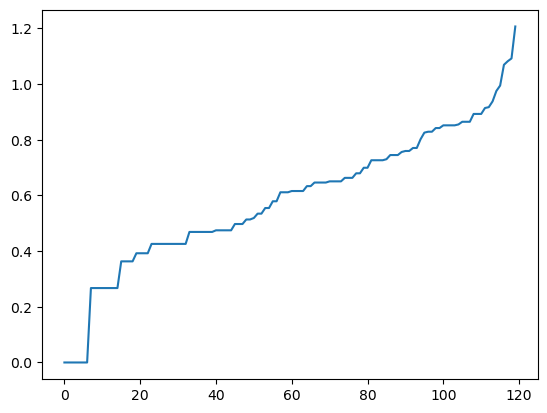

In [32]:
import matplotlib.pyplot as plt
plt.plot(sorted(stdevs_list))

In [33]:
stdevs

defaultdict(float,
            {'counting_and_probability_16.json': 0.36313651960128146,
             'counting_and_probability_6.json': 0.4258153136263201,
             'counting_and_probability_7.json': 0.0,
             'counting_and_probability_17.json': 0.0,
             'counting_and_probability_10.json': 0.6157279262148819,
             'counting_and_probability_0.json': 0.5135525910130955,
             'counting_and_probability_1.json': 0.2672612419124244,
             'counting_and_probability_11.json': 0.5547001962252291,
             'counting_and_probability_2.json': 0.4258153136263201,
             'counting_and_probability_12.json': 1.2066664642907567,
             'counting_and_probability_13.json': 0.6629935441317959,
             'counting_and_probability_3.json': 0.36313651960128146,
             'counting_and_probability_8.json': 0.8548504142651103,
             'counting_and_probability_18.json': 0.7262730392025629,
             'counting_and_probability_4.json': 0.

In [34]:
mean_stdevs

0.5859718493265291

In [36]:
results

defaultdict(list,
            {'counting_and_probability_16.json': [2,
              3,
              3,
              3,
              2,
              3,
              3,
              3,
              3,
              3,
              3,
              3,
              3,
              3],
             'counting_and_probability_6.json': [1,
              2,
              1,
              1,
              1,
              1,
              1,
              1,
              1,
              2,
              1,
              1,
              2,
              1],
             'counting_and_probability_7.json': [3,
              3,
              3,
              3,
              3,
              3,
              3,
              3,
              3,
              3,
              3,
              3,
              3,
              3],
             'counting_and_probability_17.json': [4,
              4,
              4,
              4,
              4,
              4,
              4,
    